In [172]:
# save pdf figures so that text is editable in AI
import matplotlib
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42

In [3]:
import matplotlib.pyplot as plt
import numpy as np
import glob
import os

In [728]:
# cell by gene matrix??
cbg = np.load('20CRE_mouse_brain/df_CREV2.pkl', allow_pickle=True)

In [729]:
cbg['total transcripts'] = cbg.iloc[:,:20].sum(axis=1)

cbg_clean = cbg[(cbg['total transcripts'] > 5) & (cbg['total transcripts'] < 150)]

from scipy import stats
import pandas as pd

res_total = []

for cre in cbg_clean.columns[:20]:
    res = stats.linregress(cbg_clean['total transcripts'], cbg_clean[cre])
    res_total.append(res)

y = [res_total[i].slope for i in range(20)]

yerr = [res_total[i].stderr*1.96 for i in range(20)]

d_full = pd.DataFrame(list(zip(cbg_clean.columns[:20], y, yerr)), columns = ['id', 'score', 'stderr'])

d_full_sorted = d_full.sort_values('score', axis=0, ascending=False)

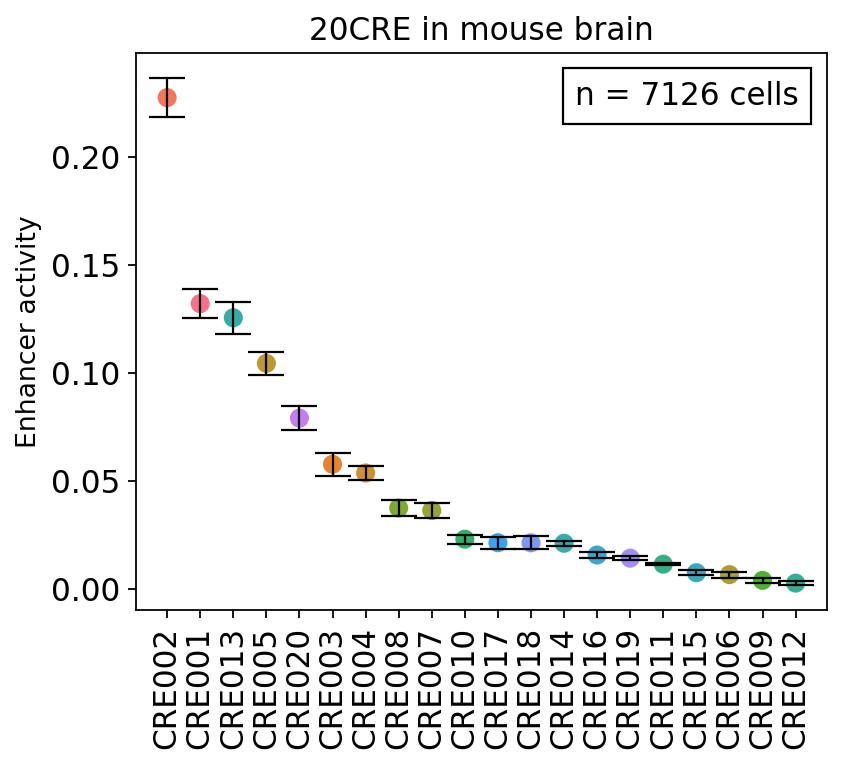

In [739]:
# Plot the enhancer activity scores in a descending order

import matplotlib.pyplot as plt
from matplotlib.offsetbox import AnchoredText

fig, ax = plt.subplots(figsize=(5.5,5))

ax.scatter(range(0,20), d_full_sorted['score'], marker='o', c=[colors[i] for i in d_full_sorted['id']], s=50, lw=1.5)
ax.errorbar(range(0,20), d_full_sorted['score'], d_full_sorted['stderr'], linestyle='', linewidth=1, capsize=8, mew=1, ecolor='k')
ax.set_xticks(range(0,20))
ax.set_xticklabels(d_full_sorted['id'])
plt.xticks(rotation=90)
ax.set_ylabel('Enhancer activity', fontsize=12)
ax.set_title('20CRE in mouse brain')
ax.set_facecolor('w')
fig.set_facecolor('w')
ax.grid(None)
# ax.set_xlabel('CREs', fontsize=12)

numcells = len(cbg_clean)

anchored_text = AnchoredText(f"n = {numcells} cells", loc=1)
ax.add_artist(anchored_text)

plt.tight_layout()
# plt.savefig('/home/zgibbs/STARR-FISH/mouse_brain_20CRE_analysis/figures/activity_scores_linear_reg_240709.pdf')
plt.show()

In [545]:
colors = {'CRE001' : '#f77189',
        'CRE002' : '#f7755d',
        'CRE003' : '#e68332',
        'CRE004' : '#ce9032',
        'CRE005' : '#bb9832',
        'CRE006' : '#aa9e31',
        'CRE007' : '#97a431',
        'CRE008' : '#7eaa31',
        'CRE009' : '#50b131',
        'CRE010' : '#32b166',
        'CRE011' : '#34af84',
        'CRE012' : '#35ae96',
        'CRE013' : '#36ada4',
        'CRE014' : '#37abb1',
        'CRE015' : '#38aabf',
        'CRE016' : '#39a7d0',
        'CRE017' : '#3ba3ec',
        'CRE018' : '#7a98f4',
        'CRE019' : '#a48cf4',
        'CRE020' : '#c67df4',
        'blank1' : '#e866f4',
        'blank2' : '#f561dd',
        'blank3' : '#f668c2',
        'blank4' : '#f66ca8'}

In [111]:
all_cbg_rep1 = pd.read_csv(r'C:\Users\zgibbs\cellpose\cell_by_CRE_10_12_2023.csv')

all_cbg_rep1['total transcripts'] = all_cbg_rep1.iloc[:,1:21].sum(axis=1)

from scipy import stats

res_total_HCT116 = []

for cre in all_cbg_rep1.columns[1:21]:
    res_HCT116 = stats.linregress(all_cbg_rep1['total transcripts'], all_cbg_rep1[cre])
    res_total_HCT116.append(res_HCT116)

y_HCT116 = [res_total_HCT116[i].slope for i in range(20)]
yerr_HCT116 = [res_total_HCT116[i].stderr*1.96 for i in range(20)]
d_full_HCT116 = pd.DataFrame(list(zip(all_cbg_rep1.columns[1:21], y_HCT116, yerr_HCT116)), columns = ['id', 'score', 'stderr'])
d_full_sorted_HCT116 = d_full_HCT116.sort_values('score', axis=0, ascending=False)

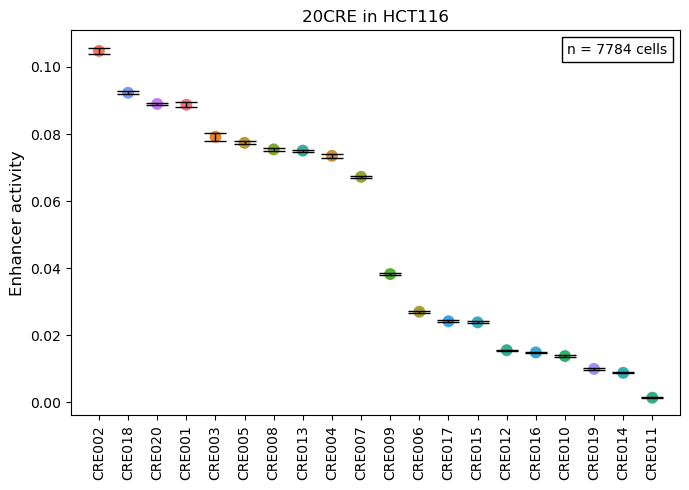

In [112]:
# Plot the enhancer activity scores in a descending order

import matplotlib.pyplot as plt
from matplotlib.offsetbox import AnchoredText

fig, ax = plt.subplots(figsize=(7,5))

ax.scatter(range(0,20), d_full_sorted_HCT116['score'], marker='o', c=[colors[i] for i in d_full_sorted_HCT116['id']], s=50, lw=1.5)
ax.errorbar(range(0,20), d_full_sorted_HCT116['score'], d_full_sorted_HCT116['stderr'], linestyle='', linewidth=1, capsize=8, mew=1, ecolor='k')
ax.set_xticks(range(0,20))
ax.set_xticklabels(d_full_sorted_HCT116['id'])
plt.xticks(rotation=90)
ax.set_ylabel('Enhancer activity', fontsize=12)
ax.set_title('20CRE in HCT116')
# ax.set_xlabel('CREs', fontsize=12)

numcells = len(all_cbg_rep1)

anchored_text = AnchoredText(f"n = {numcells} cells", loc=1)
ax.add_artist(anchored_text)

plt.tight_layout()
# plt.savefig('/home/zgibbs/STARR-FISH/HCT116_20CRE_analysis/figures/rep1_activity_240607.pdf')
plt.show()

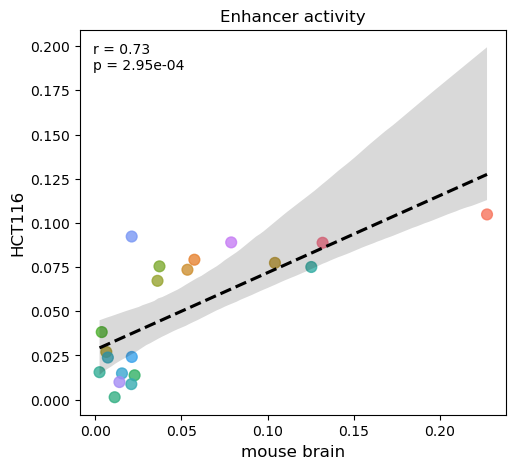

In [114]:
# plot the correlation between replicates

import seaborn as sns
from scipy import stats

fig, ax = plt.subplots(figsize=(5.5,5))

x = d_full['score']
y = d_full_HCT116['score']

# sns.set_palette("viridis")

sns.regplot(x=x, y=y,
            scatter_kws={'color' : [colors[i] for i in d_full['id']], 's' : 60},
            line_kws={'ls' : 'dashed', 'color' : 'k'})

ax.set_ylabel('HCT116', fontsize=12)
ax.set_xlabel('mouse brain', fontsize=12)
ax.set_title('Enhancer activity')

stats = stats.pearsonr(x, y)

corrcoef = np.around(stats[0], 2)
pval = np.format_float_scientific(stats[1], 2)

anchored_text = AnchoredText(f"r = {corrcoef}\np = {pval}", loc=2, frameon=False)
ax.add_artist(anchored_text)

# plt.savefig('/home/zgibbs/STARR-FISH/HCT116_20CRE_analysis/figures/rep1_vs_rep2_activity_240607.pdf')
plt.show()

### Visualize CRE positive cells in mouse brain

In [38]:
CRE_cbg_ = np.load('20CRE_mouse_brain/df_CREV2.pkl', allow_pickle=True)

In [38]:
# Load cell by gene matrix for CREs
CRE_cbg = np.load('20CRE_mouse_brain/df_CREV2.pkl', allow_pickle=True)
CRE_cbg['total transcripts'] = CRE_cbg.iloc[:,:20].sum(axis=1)
CRE_cbg

,CRE001,CRE002,CRE003,CRE004,CRE005,CRE006,CRE007,CRE008,CRE009,CRE010,...,blank038,blank039,blank040,blank041,blank042,blank043,blank044,blank045,blank046,total transcripts
0,3.0,21.0,10.0,1.0,3.0,0.0,1.0,9.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,67.0
1,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
8,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0
10,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,9.0
12,0.0,5.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,7.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
353000706,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0
353000759,0.0,0.0,0.0,0.0,2.0,0.0,2.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.0
353000788,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
353000878,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [40]:
CRE_cbg.iloc[158:,:]

,CRE001,CRE002,CRE003,CRE004,CRE005,CRE006,CRE007,CRE008,CRE009,CRE010,...,blank038,blank039,blank040,blank041,blank042,blank043,blank044,blank045,blank046,total transcripts
852,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1000000,6.0,5.0,2.0,3.0,7.0,0.0,1.0,1.0,1.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,44.0
1000005,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1000010,0.0,0.0,6.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.0
1000014,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
353000706,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0
353000759,0.0,0.0,0.0,0.0,2.0,0.0,2.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.0
353000788,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
353000878,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [41]:
# Load cell by gene matrix for marker genes
gene_cbg = np.load('20CRE_mouse_brain/dff_Eth1V2.pkl', allow_pickle=True)
gene_cbg

,2610528A11Rik,A1cf,A230050P20Rik,Abca8a,Abcb1b,Abcb4,Abcg1,Abhd15,Adamts1,Adamts9,...,blank0338-L1,blank0339-L1,blank0340-L1,blank0341-L1,blank0342-L1,blank0343-L1,blank0344-L1,blank0345-L1,blank0346-L1,blank0347-L1
Conv_zscan__000_112,0.0,0.0,0.0,1.0,1.0,2.0,2.0,1.0,0.0,2.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Conv_zscan__000_128,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,2.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Conv_zscan__000_133,0.0,0.0,6.0,1.0,1.0,3.0,0.0,0.0,1.0,3.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Conv_zscan__000_145,0.0,0.0,0.0,3.0,0.0,0.0,4.0,0.0,1.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Conv_zscan__000_17,0.0,0.0,6.0,0.0,2.0,2.0,3.0,0.0,1.0,4.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Conv_zscan__351_35100733,0.0,0.0,12.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Conv_zscan__351_35100759,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Conv_zscan__351_35100819,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Conv_zscan__352_35200818,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [42]:
# Load cell metadata 
cell_data = np.load('20CRE_mouse_brain/cell_df_Eth1V2.pkl', allow_pickle=True)
cell_data

,cell_id,volm,zc,xc,yc,z_um_abs,x_um_abs,y_um_abs
Conv_zscan__000_112,112.0,27316.0,9.899034,532.249890,552.196844,9.899034,235.834362,4895.734657
Conv_zscan__000_128,128.0,22227.0,6.737751,600.349170,292.755343,6.737751,265.343142,4783.313465
Conv_zscan__000_133,133.0,30771.0,9.308180,624.007572,626.533912,9.308180,275.594801,4927.946395
Conv_zscan__000_145,145.0,23201.0,9.111202,692.264040,342.984958,9.111202,305.171694,4805.078962
Conv_zscan__000_17,17.0,28112.0,6.682555,39.670532,314.867210,6.682555,22.389875,4792.894979
...,...,...,...,...,...,...,...,...
Conv_zscan__351_35100733,35100733.0,5384.0,16.291790,506.670134,501.093053,16.291790,535.873902,4873.590362
Conv_zscan__351_35100759,35100759.0,5605.0,17.518466,176.095450,628.223194,17.518466,392.629281,4928.678394
Conv_zscan__351_35100819,35100819.0,10088.0,17.171590,92.750000,188.968279,17.171590,356.514030,4738.340455
Conv_zscan__352_35200818,35200818.0,2509.0,16.241530,306.657633,364.335592,16.241530,138.947365,4814.763939


(-275.2027050065057, 5818.484932367087, -298.55091354088944, 7703.33945160367)

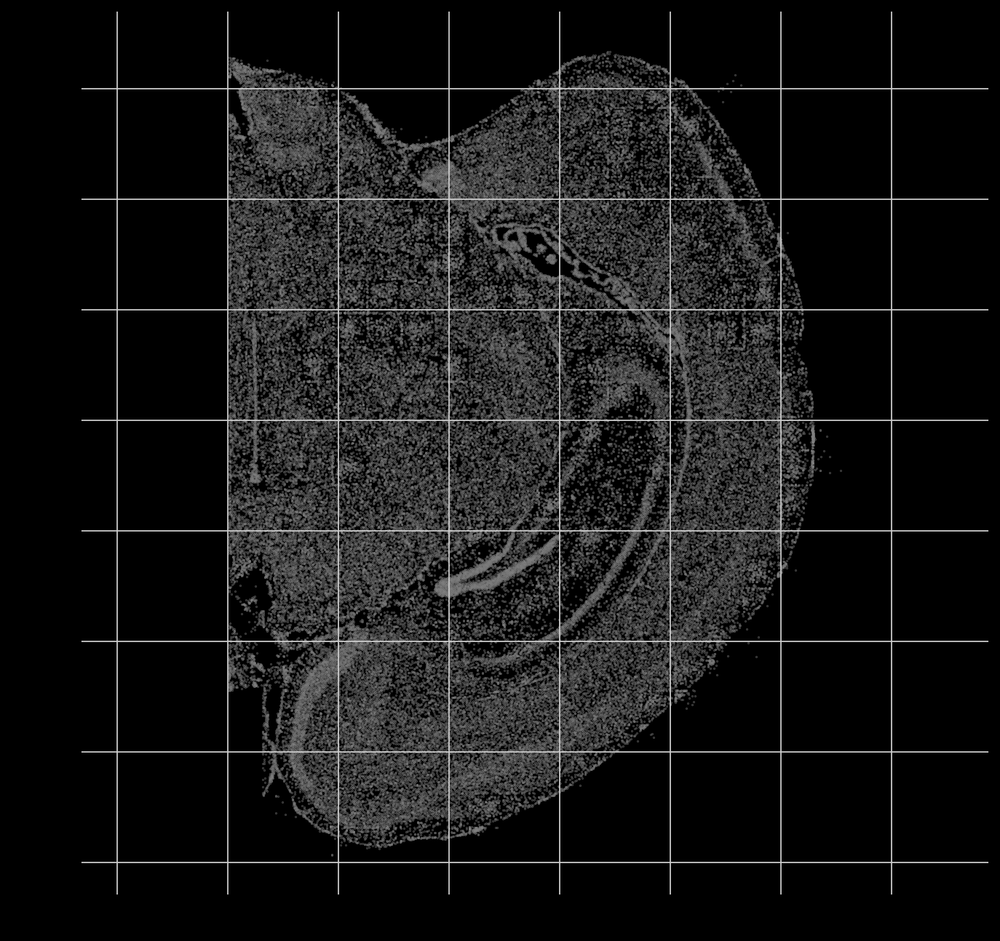

In [43]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(10,10), facecolor='k')
x, y = cell_data['x_um_abs'], cell_data['y_um_abs']
ax.scatter(x, y, c='gray', s=0.05)
# ax = plt.gca()
ax.set_facecolor('k')
plt.axis('equal')

In [44]:
# little function to correct the cell ids from CRE_cbg to match those from cell_data
def refine_cell_ids(my_list, index):
    return [x[:index] + x[index + 1:] for x in my_list]
    
# Create list of cell ids for CRE-positive cells
CRE_counts = CRE_cbg[(CRE_cbg['total transcripts'] > 5)]
idx = CRE_counts.index
idx2 = idx.to_list()
idx2 = [str(i) for i in idx2]
idx3 = refine_cell_ids(idx2, -4)
idx3 = [float(i) for i in idx3]
CRE_counts['cell_id'] = idx3

/tmp/ipykernel_201344/3529826497.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  CRE_counts['cell_id'] = idx3


In [45]:
# Create new dataframe of cell metadata for the CRE-positive cells
pos_cells = cell_data[cell_data['cell_id'].isin(CRE_counts['cell_id'])]
num_cells = len(pos_cells)
print(str(num_cells) + ' cells')

6893 cells


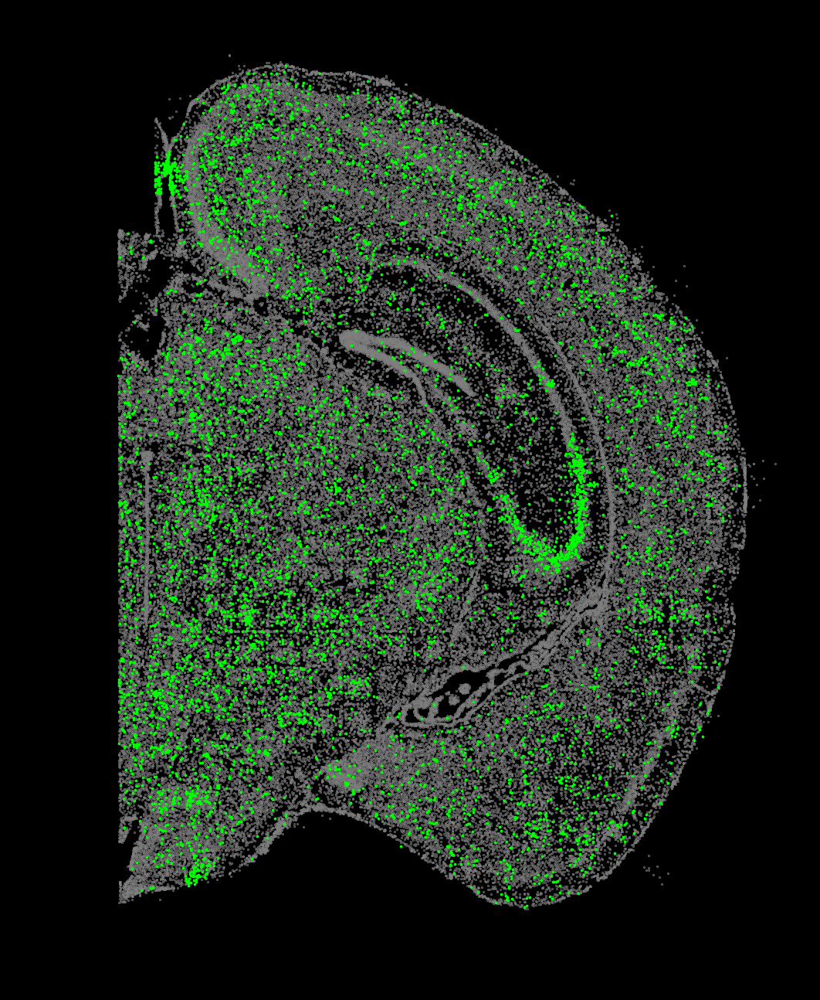

In [46]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(7.5,10), facecolor='k')
ax.scatter(cell_data['x_um_abs'], cell_data['y_um_abs'], c='gray', marker='o', s=0.1)
x = pos_cells['x_um_abs']
y = pos_cells['y_um_abs']
ax.scatter(x, y, c='lime', s=0.5)
plt.gca().invert_yaxis()
ax.set_facecolor('k')
ax.grid(False)
# plt.axis('equal')

# plt.savefig('/home/zgibbs/STARR-FISH/mouse_brain_20CRE_analysis/figures/CRE_pos_cells_over_5.png', dpi=600)

In [740]:
pos_cells

,cell_id,volm,zc,xc,yc,z_um_abs,x_um_abs,y_um_abs
Conv_zscan__000_133,133.0,30771.0,9.308180,624.007572,626.533912,9.308180,275.594801,4927.946395
Conv_zscan__000_170,170.0,40688.0,9.850300,91.459005,278.127654,9.850300,44.830856,4776.974995
Conv_zscan__000_28,28.0,22392.0,9.510897,108.975125,454.254421,9.510897,52.420941,4853.294246
Conv_zscan__000_301,301.0,30187.0,11.223076,252.782390,125.165369,11.223076,114.735505,4710.693378
Conv_zscan__000_315,315.0,16945.0,11.131366,334.450103,641.001121,11.131366,150.123759,4934.215326
...,...,...,...,...,...,...,...,...
Conv_zscan__351_35100255,35100255.0,24342.0,8.319448,576.036850,523.162969,8.319448,565.931888,4883.153698
Conv_zscan__351_35100392,35100392.0,23469.0,6.853083,647.115983,584.225105,6.853083,596.731898,4909.613143
Conv_zscan__351_35100451,35100451.0,14595.0,12.482905,420.610894,612.177527,12.482905,498.582713,4921.725486
Conv_zscan__351_35100477,35100477.0,28865.0,10.471332,329.695271,74.405682,10.471332,459.187155,4688.698190


In [765]:
code = list(CRE_cbg.columns[:20])

df = CRE_cbg

for x in code:
    df[x+'_bool'] = df[x].gt(0).any(1) 

TypeError: any() takes 1 positional argument but 2 were given

In [772]:
df = CRE_cbg.iloc[:,1].any(1)

TypeError: any() takes 1 positional argument but 2 were given

In [779]:
CRE_cbg[code] = CRE_cbg[code].astype('bool')

In [782]:
CRE_cbg['bool_sum'] = CRE_cbg[code].sum(1)

In [840]:
counts5 = CRE_cbg[(CRE_cbg['total transcripts'] > 5)]
counts4 = CRE_cbg[(CRE_cbg['total transcripts'] > 4)]
counts3 = CRE_cbg[(CRE_cbg['total transcripts'] > 3)]
counts2 = CRE_cbg[(CRE_cbg['total transcripts'] > 2)]
counts1 = CRE_cbg[(CRE_cbg['total transcripts'] > 1) & (CRE_cbg['total transcripts'] < 10)]

In [878]:
oneCRE = len(counts3[(counts3['bool_sum'] == 1)])
twoCRE = len(counts3[(counts3['bool_sum'] == 2)])
threeCRE = len(counts3[(counts3['bool_sum'] == 3)])
fourCRE = len(counts3[(counts3['bool_sum'] == 4)])
fiveCRE = len(counts3[(counts3['bool_sum'] == 5)])
print(oneCRE, twoCRE, threeCRE, fourCRE, fiveCRE)

804 1828 2427 2082 1173


In [879]:
counts1

,CRE001,CRE002,CRE003,CRE004,CRE005,CRE006,CRE007,CRE008,CRE009,CRE010,...,blank039,blank040,blank041,blank042,blank043,blank044,blank045,blank046,total transcripts,bool_sum
8,False,False,False,False,False,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,2
10,False,False,False,False,False,False,False,True,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,9.0,3
12,False,True,False,False,False,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,7.0,3
15,False,False,False,False,False,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,2
22,False,True,False,False,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
353000619,False,False,False,False,False,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,1
353000620,False,False,True,False,False,False,True,True,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,3
353000650,False,False,False,False,False,False,False,True,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.0,2
353000706,False,False,False,True,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,4


In [852]:
num_CRE_counts = oneCRE, twoCRE, threeCRE, fourCRE, fiveCRE
num_CRE = ['1 CRE', '2 CREs', '3 CREs', '4 CREs', '5 CREs']

In [850]:
num_CRE_counts

(3262, 9657, 3920, 1579, 694)

In [880]:
counts1['bool_sum'].mean()

2.3793635288674104

In [823]:
CRE_cbg['total transcripts'].mean()

7.120008689126743

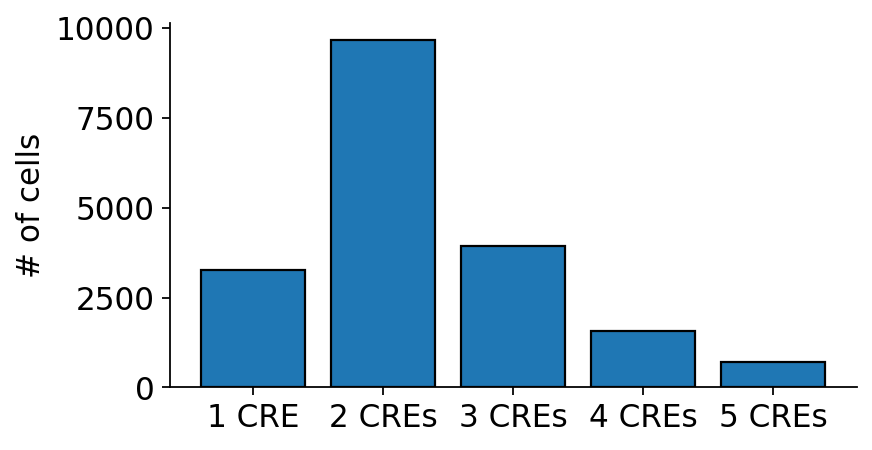

In [882]:
fig, ax = plt.subplots(figsize=(5.5,3))

ax.bar(num_CRE, num_CRE_counts, edgecolor='k', lw=1)
ax.grid(None)
ax.spines[['right', 'top']].set_visible(False)
ax.set_ylabel('# of cells')

# plt.savefig('/home/zgibbs/STARR-FISH/mouse_brain_20CRE_analysis/figures/CRE_MOI_240709.pdf')
plt.show()

#### Combine CRE counts with gene counts into one matrix

In [47]:
def refine_cell_ids2(my_list, index):
    return [x[index:] for x in my_list]
    
# Create list of cell ids for gene_cbg
gene_counts = gene_cbg
idx = gene_counts.index
idx2 = idx.to_list()
idx2 = [str(i) for i in idx2]
idx3 = refine_cell_ids2(idx2, 16)
idx3 = [float(i) for i in idx3]
gene_counts['cell_id'] = idx3

In [48]:
gene_counts.columns

Index(['2610528A11Rik', 'A1cf', 'A230050P20Rik', 'Abca8a', 'Abcb1b', 'Abcb4',
       'Abcg1', 'Abhd15', 'Adamts1', 'Adamts9',
       ...
       'blank0339-L1', 'blank0340-L1', 'blank0341-L1', 'blank0342-L1',
       'blank0343-L1', 'blank0344-L1', 'blank0345-L1', 'blank0346-L1',
       'blank0347-L1', 'cell_id'],
      dtype='object', length=697)

In [54]:
# little function to correct the cell ids from CRE_cbg to match those from cell_data
def refine_cell_ids(my_list, index):
    return [x[:index] + x[index + 1:] for x in my_list]
    
# Create list of cell ids for CRE_cbg (total)
CRE_counts2 = CRE_cbg.iloc[159:,:]
idx = CRE_counts2.index
idx2 = idx.to_list()
idx2 = [str(i) for i in idx2]
idx3 = refine_cell_ids(idx2, -4)
idx3 = [float(i) for i in idx3]
CRE_counts2['cell_id'] = idx3

/tmp/ipykernel_201344/2015506762.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  CRE_counts2['cell_id'] = idx3


In [168]:
import pandas as pd
testy = CRE_counts2[CRE_counts2['cell_id'].isin(gene_counts['cell_id'])]

In [60]:
CRE_counts3 = CRE_counts2.set_index('cell_id')

In [161]:
len(np.unique(total_cbg['cell_id']))

92221

In [61]:
CRE_counts3.index.value_counts()

cell_id
1700317.0     2
22400171.0    2
24000180.0    2
1800093.0     2
33800083.0    2
             ..
13100090.0    1
13100091.0    1
13100092.0    1
13100093.0    1
35300897.0    1
Name: count, Length: 50431, dtype: int64

In [170]:
total_cbg2 = pd.concat([total_cbg.iloc[:,:348], total_cbg.iloc[:,696:717]], axis=1)

In [192]:
total_cbg2['cell_id']

0             112.0
1             128.0
2             133.0
3             145.0
4              17.0
            ...    
96578    35100733.0
96579    35100759.0
96580    35100819.0
96581    35200818.0
96582    35300637.0
Name: cell_id, Length: 96583, dtype: float64

In [194]:
total_cbg3 = pd.merge(cell_data, total_cbg2, how='left', left_on='cell_id', right_on='cell_id')

In [204]:
total_cbg3.iloc[:,8:]

,2610528A11Rik,A1cf,A230050P20Rik,Abca8a,Abcb1b,Abcb4,Abcg1,Abhd15,Adamts1,Adamts9,...,CRE011,CRE012,CRE013,CRE014,CRE015,CRE016,CRE017,CRE018,CRE019,CRE020
0,0.0,0.0,0.0,1.0,1.0,2.0,2.0,1.0,0.0,2.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,2.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,0.0,0.0,6.0,1.0,1.0,3.0,0.0,0.0,1.0,3.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,0.0,0.0,0.0,3.0,0.0,0.0,4.0,0.0,1.0,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,0.0,0.0,6.0,0.0,2.0,2.0,3.0,0.0,1.0,4.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
105852,0.0,0.0,12.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
105853,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
105854,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
105855,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [612]:
import scanpy as sc
import anndata as adata
adata_merfish2 = adata.AnnData(total_cbg3.iloc[:,8:])
adata_merfish2.obsm['spatial'] = total_cbg3.iloc[:,6:8].to_numpy()

/home/zgibbs/miniconda3/envs/scanpy/lib/python3.9/site-packages/anndata/_core/aligned_df.py:67: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


In [274]:
sc.pp.filter_genes(adata_merfish2, min_cells=0)

sc.pp.filter_cells(adata_merfish2, min_counts=0)
sc.pp.filter_cells(adata_merfish2, min_genes=0)

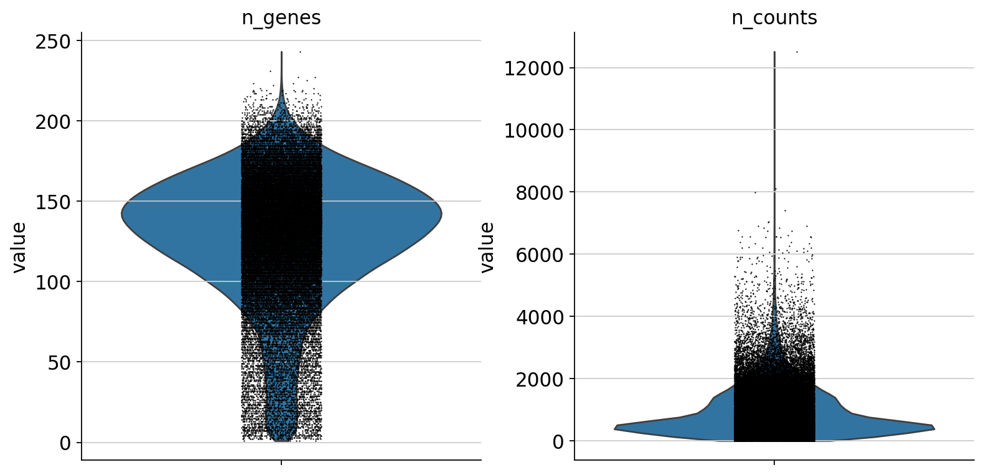

In [275]:
sc.pl.violin(adata_merfish2, ['n_genes', 'n_counts'], multi_panel=True)

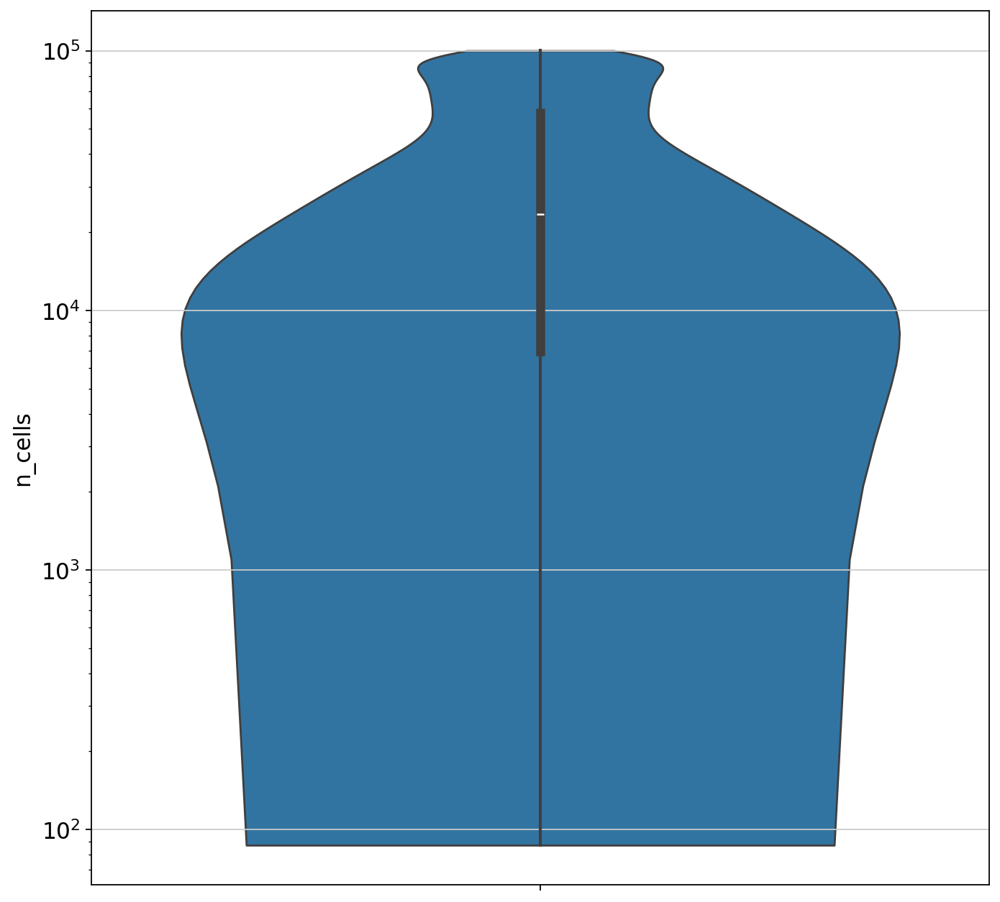

In [276]:
import seaborn as sns
sns.violinplot(adata_merfish2.var['n_cells'], cut=0)
plt.yscale('log')

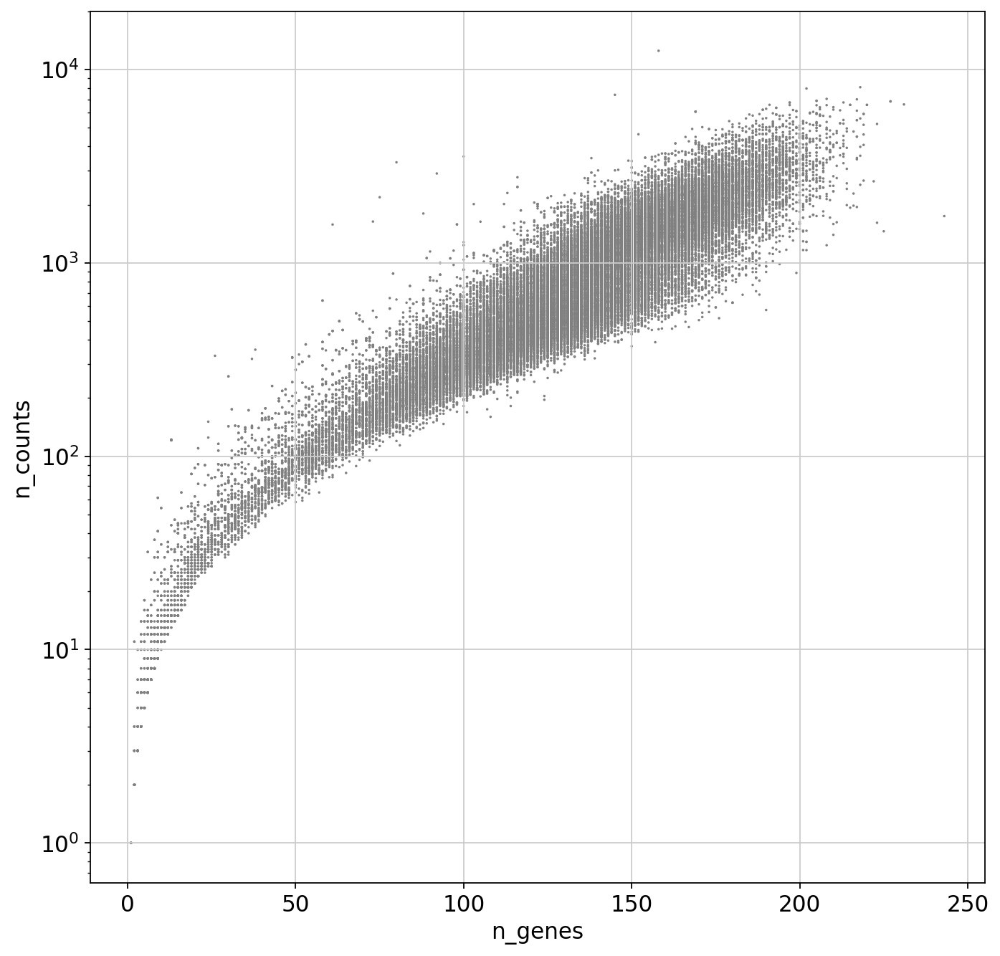

In [277]:
fig, ax = plt.subplots(figsize=(10, 10))
kwargs = {'size' : 10}
ax.set_yscale('log')
# ax.set_ylim(0, 2000)
sc.pl.scatter(adata_merfish2, "n_genes", "n_counts", ax=ax, **kwargs)

In [613]:
sc.pp.filter_genes(adata_merfish2, min_cells=100)

sc.pp.filter_cells(adata_merfish2, min_counts=50)
sc.pp.filter_cells(adata_merfish2, min_genes=50)

In [614]:
np.mean(adata_merfish2.X.sum(axis=1))

1028.5589741545941

In [615]:
sc.pp.normalize_per_cell(adata_merfish2, counts_per_cell_after=1e3)

In [616]:
sc.pp.log1p(adata_merfish2)

In [720]:
adata_merfish2.obs

,n_counts,n_genes,clusters
37,366.0,133,0
43,1419.0,168,1
49,263.0,116,2
50,1723.0,187,3
55,1368.0,177,3
...,...,...,...
105831,1154.0,142,1
105836,278.0,84,1
105837,950.0,128,1
105839,344.0,101,11


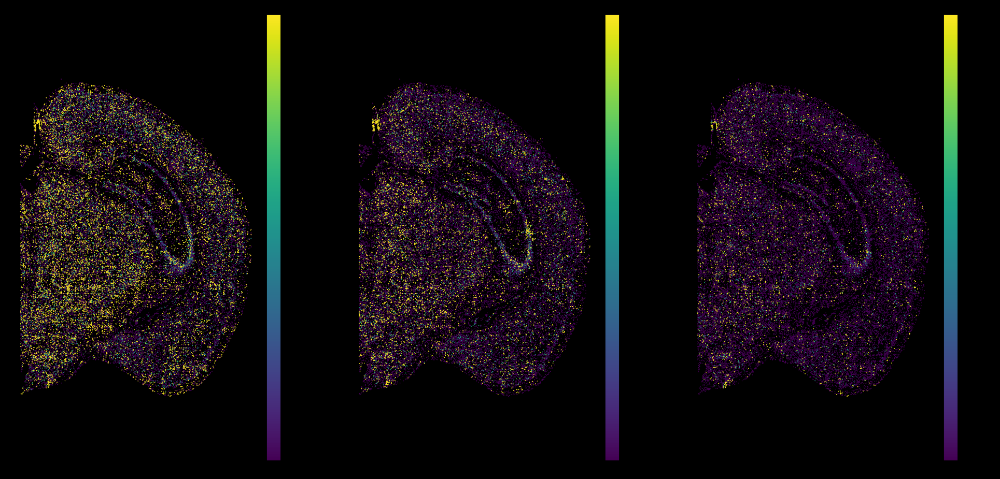

In [726]:
# fix, ax = plt.subplots(figsize=(8,11))
# ax.set_facecolor('k')
sc.set_figure_params(figsize=(4,7), facecolor='k', dpi_save=600, vector_friendly=True)

sc.pl.spatial(adata_merfish2, img_key=None, color=['CRE002','CRE005','CRE008'], spot_size=20,
              vmax=1, frameon=False)

# save='CRE_expression_examples'

In [624]:
sc.pp.pca(adata_merfish2, n_comps=30)
sc.pp.neighbors(adata_merfish2, n_neighbors=18)

In [625]:
sc.tl.leiden(
    adata_merfish2,
    key_added="clusters",
    resolution=5,
    n_iterations=5,
    flavor="igraph",
    directed=False,
)

In [626]:
sc.tl.umap(adata_merfish2, negative_sample_rate=10, min_dist=0.3)

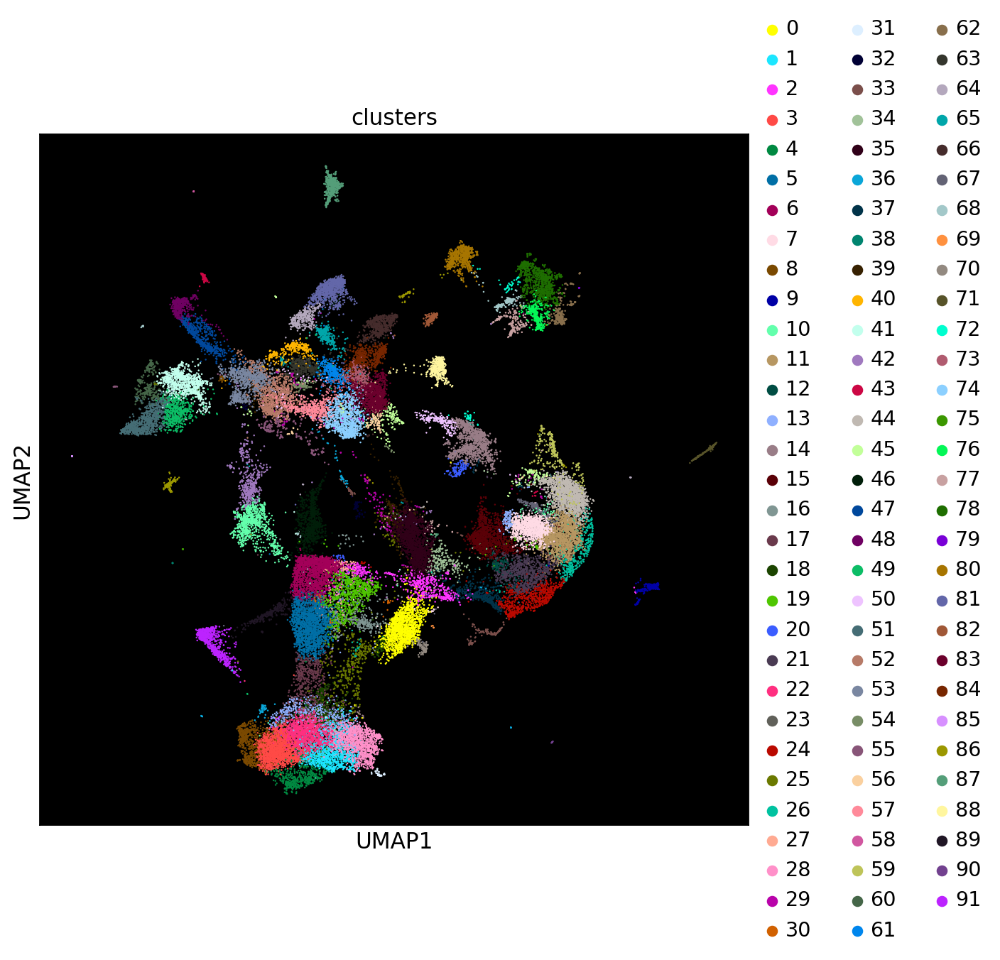

In [627]:
fix, ax = plt.subplots(figsize=(8,8))
sc.set_figure_params(figsize=(10,10), facecolor='w', vector_friendly=False)
kwargs = {'size' : 5, 'facecolor' : 'w'}
ax.set_facecolor('k')
ax.invert_yaxis()
sc.pl.umap(adata_merfish2, color="clusters", ax=ax, **kwargs, save='total_cbg_UMAP_1_240709')

In [633]:
total_cbg_pal = glasbey.create_palette(palette_size=50)

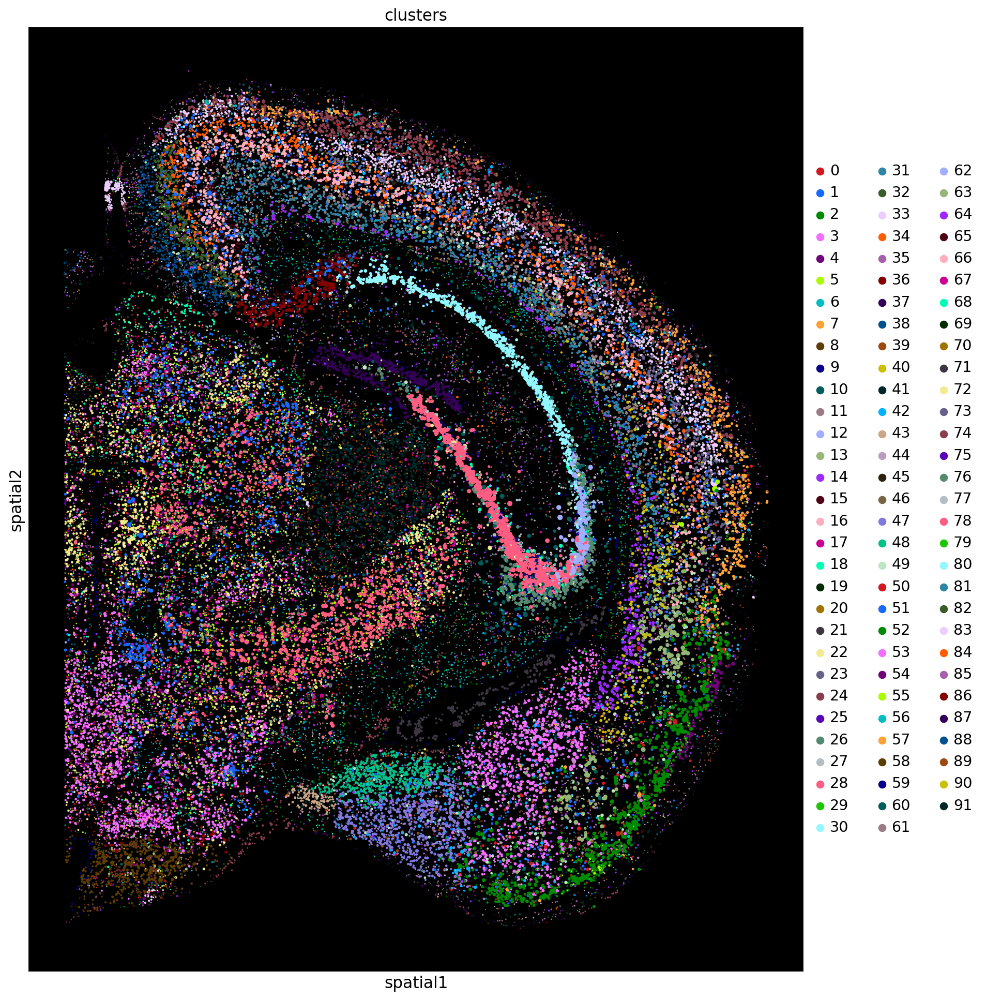

In [634]:
sc.set_figure_params(figsize=(8,11), facecolor='w', vector_friendly=False)

fix, ax = plt.subplots(figsize=(12,15))
# ax.scatter(cell_data['x_um_abs'], cell_data['y_um_abs'], c='gray', s=0.05)
kwargs = {'facecolor' : 'w'}
ax.set_facecolor('k') 
ax.invert_yaxis()
sc.pl.embedding(adata_merfish2, basis="spatial", color="clusters", palette=total_cbg_pal,
                ax=ax, **kwargs, save='total_cbg_spatial_map_1_240709',
                size=adata_merfish2.obs['n_counts']/70)

In [676]:
adata_merfish2.var_names[:-20]

Index(['2610528A11Rik', 'A1cf', 'A230050P20Rik', 'Abca8a', 'Abcb1b', 'Abcb4',
       'Abcg1', 'Abhd15', 'Adamts1', 'Adamts9',
       ...
       'Myh3', 'Myh6', 'Myl2', 'Myl3', 'Myl7', 'Mylk', 'Mylk4', 'Myo18b',
       'Myo1e', 'Myocd'],
      dtype='object', length=347)

In [892]:
sc.tl.dendrogram(adata_merfish2, groupby='clusters', optimal_ordering=True,
                 linkage_method='average', var_names=adata_merfish2.var_names[:-20])

In [907]:
CRE_rank_list = ['CRE002', 'CRE001', 'CRE013', 'CRE005', 'CRE020', 'CRE003',
                 'CRE004', 'CRE008', 'CRE007', 'CRE010', 'CRE017', 'CRE018',
                 'CRE014', 'CRE016', 'CRE019', 'CRE011', 'CRE015', 'CRE006',
                 'CRE009', 'CRE012']

Text(0.5, 1.0, 'Elbow curve')

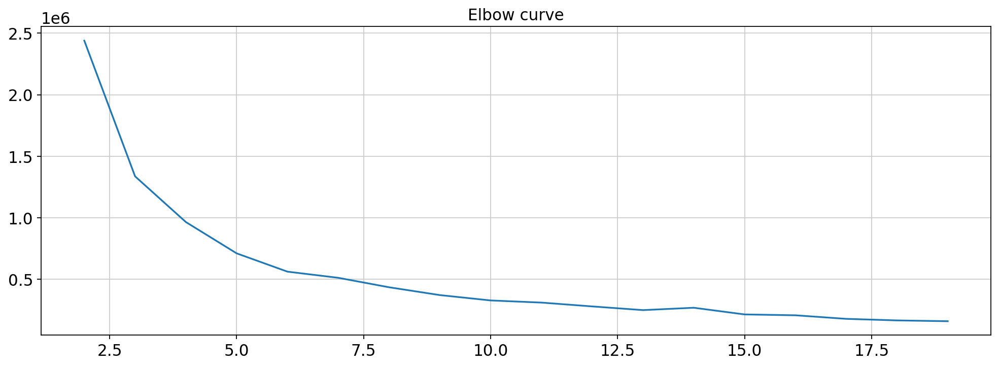

In [920]:
from sklearn.cluster import KMeans
from matplotlib import pyplot as plt

distorsions = []
for k in range(2, 20):
    kmeans = KMeans(n_clusters=k)
    kmeans.fit(umap_coordinates)
    distorsions.append(kmeans.inertia_)

fig = plt.figure(figsize=(15, 5))
plt.plot(range(2, 20), distorsions)
plt.grid(True)
plt.title('Elbow curve')

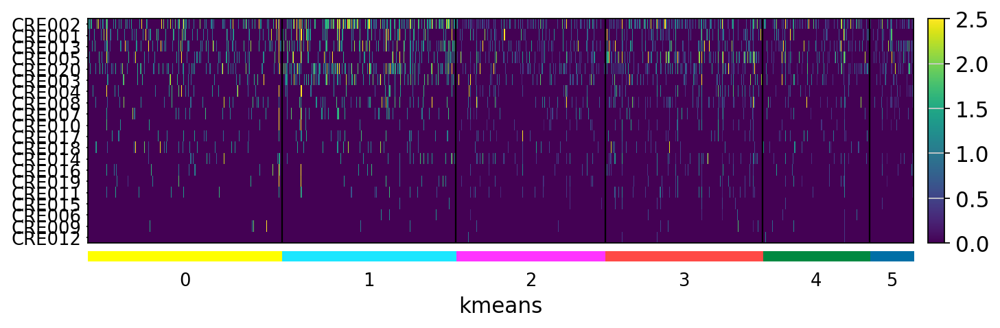

In [927]:
from sklearn import cluster

sc.set_figure_params(dpi_save=600, vector_friendly=False)

umap_coordinates = adata_merfish2.obsm['X_umap'] # extract the UMAP coordinates for each cell
kmeans = cluster.KMeans(n_clusters=6, random_state=0).fit(umap_coordinates) # fix the random state for reproducibility

adata_merfish2.obs['kmeans'] = kmeans.labels_ # retrieve the labels and add them as a metadata column in our AnnData object
adata_merfish2.obs['kmeans'] = adata_merfish2.obs['kmeans'].astype(str)

sc.pl.heatmap(adata_merfish2, var_names=CRE_rank_list, groupby='kmeans',
              figsize=(10,3), vmax=2.5, swap_axes=True, save='kmeans_clustering_CRE_expression.pdf') # plot the results

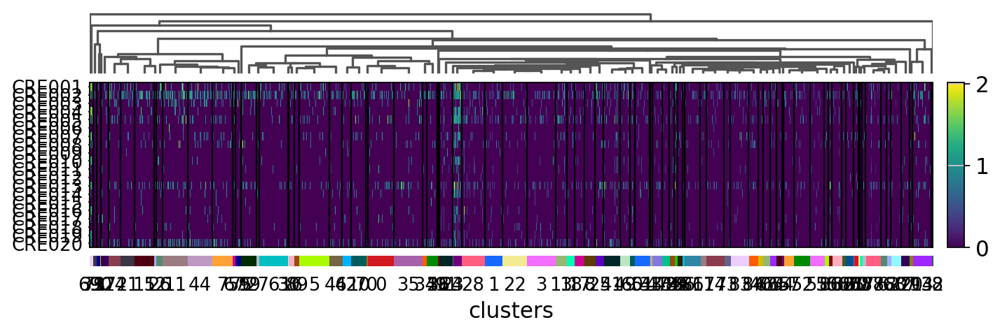

In [893]:
sc.pl.heatmap(adata_merfish2, var_names=adata_merfish2.var_names[-20:], groupby='clusters',
              figsize=(10,3), dendrogram='dendrogram_clusters', log=True, swap_axes=True)

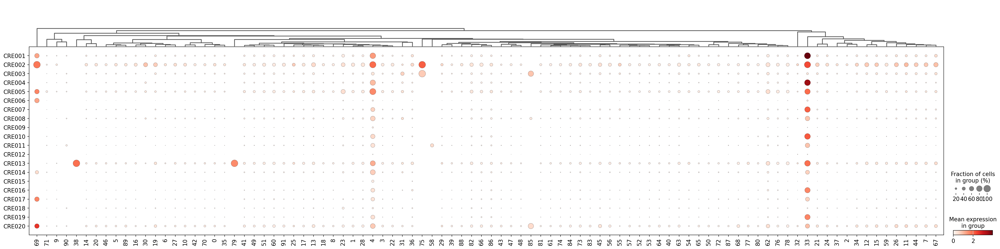

In [776]:
sc.pl.dotplot(adata_merfish2, var_names=adata_merfish2.var_names[-20:], groupby='clusters', swap_axes=True,
             dendrogram=True)

In [885]:
sc.pl.clustermap(adata_merfish2, 'CRE001')

KeyError: 'CRE001'

### Cluster cells and plot with Scanpy using only genes

In [10]:
import scanpy as sc
import anndata as adata
adata_merfish = adata.AnnData(gene_cbg.iloc[:,:348])
adata_merfish.obsm['spatial'] = cell_data.iloc[:,-2:].to_numpy()

In [11]:
adata_merfish

AnnData object with n_obs × n_vars = 96540 × 348
    obsm: 'spatial'

In [12]:
sc.pp.filter_genes(adata_merfish, min_cells=0)

sc.pp.filter_cells(adata_merfish, min_counts=0)
sc.pp.filter_cells(adata_merfish, min_genes=0)

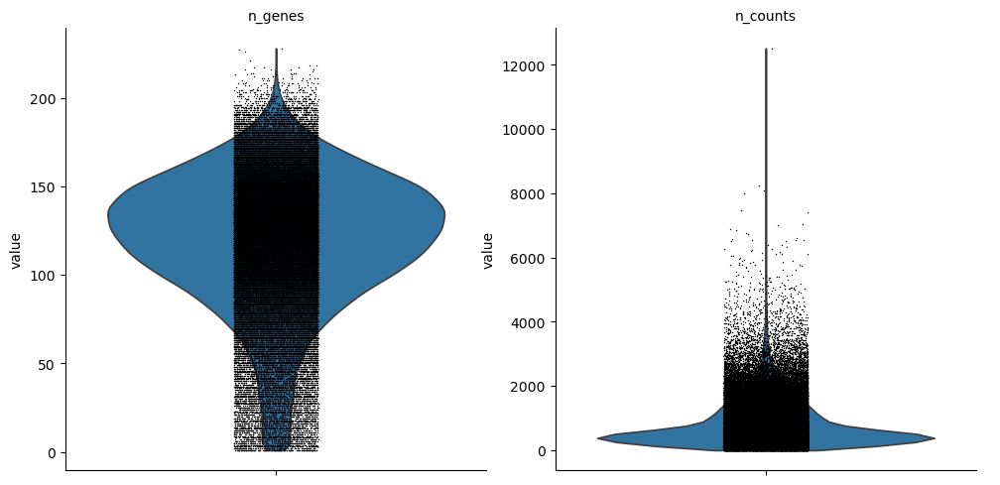

In [13]:
sc.pl.violin(adata_merfish, ['n_genes', 'n_counts'], multi_panel=True)

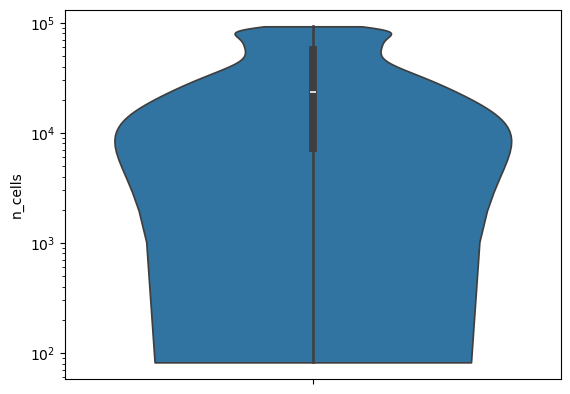

In [14]:
import seaborn as sns
sns.violinplot(adata_merfish.var['n_cells'], cut=0)
plt.yscale('log')

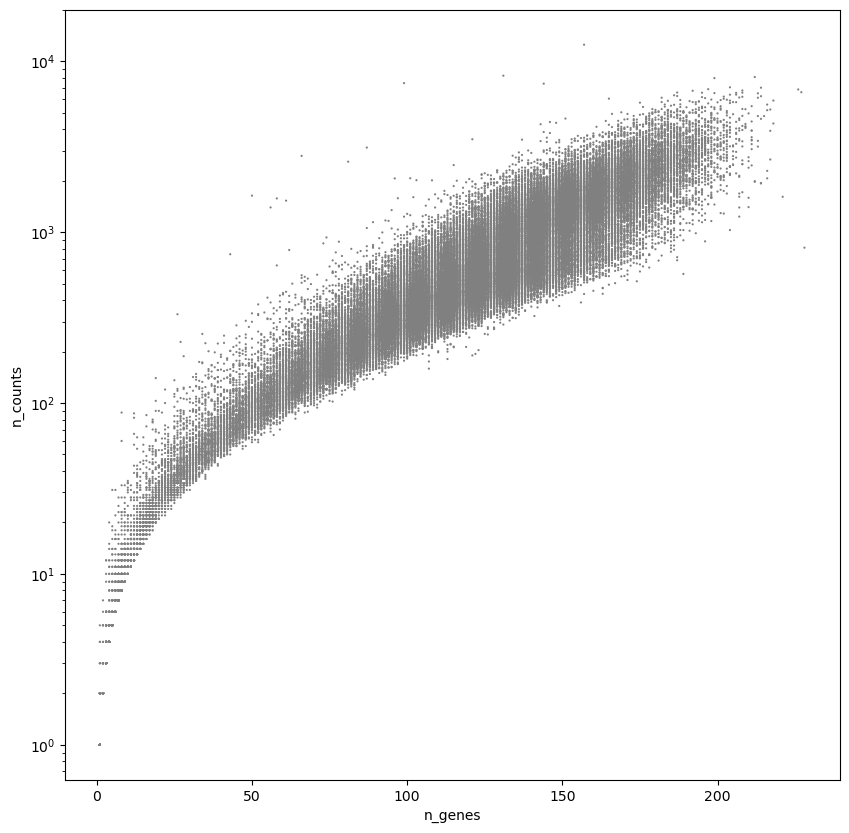

In [15]:
fig, ax = plt.subplots(figsize=(10, 10))
kwargs = {'size' : 10}
ax.set_yscale('log')
# ax.set_ylim(0, 2000)
sc.pl.scatter(adata_merfish, "n_genes", "n_counts", ax=ax, **kwargs)


In [16]:
adata_merfish

AnnData object with n_obs × n_vars = 96540 × 348
    obs: 'n_counts', 'n_genes'
    var: 'n_cells'
    obsm: 'spatial'

In [17]:
sc.pp.filter_genes(adata_merfish, min_cells=100)

sc.pp.filter_cells(adata_merfish, min_counts=50)
sc.pp.filter_cells(adata_merfish, min_genes=50)

In [18]:
np.mean(adata_merfish.X.sum(axis=1))

863.0448903508772

In [19]:
sc.pp.normalize_per_cell(adata_merfish, counts_per_cell_after=1e3)

In [20]:
sc.pp.log1p(adata_merfish)

In [353]:
# sc.pp.highly_variable_genes(adata_merfish, n_top_genes=100)

In [21]:
sc.pp.pca(adata_merfish, n_comps=30)

In [22]:
sc.pp.neighbors(adata_merfish, n_neighbors=18)

In [567]:
# sc.tl.leiden(
#     adata_merfish,
#     key_added="clusters",
#     resolution=3,
#     n_iterations=5,
#     flavor="igraph",
#     directed=False,
# )

# sc.tl.paga(adata_merfish, groups='clusters')

# sc.pl.paga(adata_merfish)

In [23]:
sc.tl.leiden(
    adata_merfish,
    key_added="clusters",
    resolution=5,
    n_iterations=5,
    flavor="igraph",
    directed=False,
)

In [24]:
sc.tl.umap(adata_merfish, negative_sample_rate=10, min_dist=0.3)
# mean_dist = 0.1

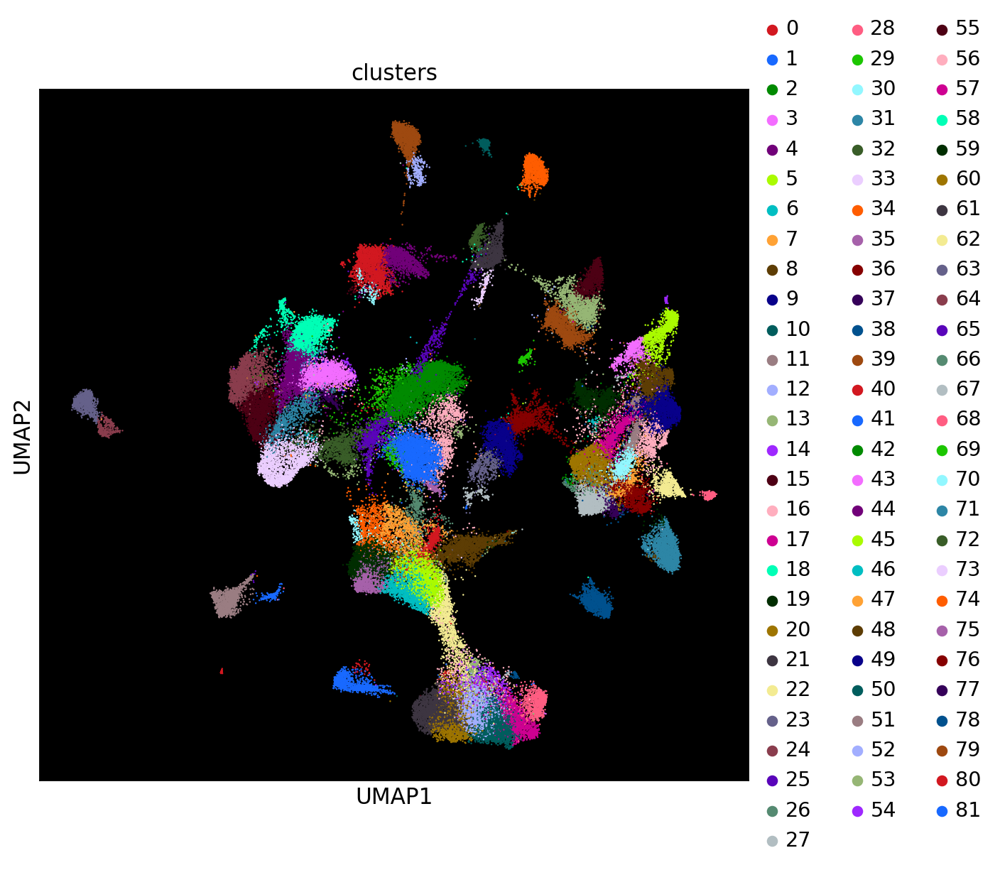

In [27]:
fix, ax = plt.subplots(figsize=(8,8))
sc.set_figure_params(figsize=(10,10), facecolor='w', dpi_save=600, vector_friendly=True)
kwargs = {'size' : 5, 'facecolor' : 'w'}
ax.set_facecolor('k')
ax.invert_yaxis()
sc.pl.umap(adata_merfish, color="clusters", palette=test_pal, ax=ax, **kwargs, save='gene_UMAP_12b_240709')

# plt.savefig('/home/zgibbs/STARR-FISH/mouse_brain_20CRE_analysis/figures/gene_UMAP_240707.pdf')

In [ ]:
adata_merfish.obs

In [31]:
import glasbey
test_pal = glasbey.create_palette(palette_size=38)

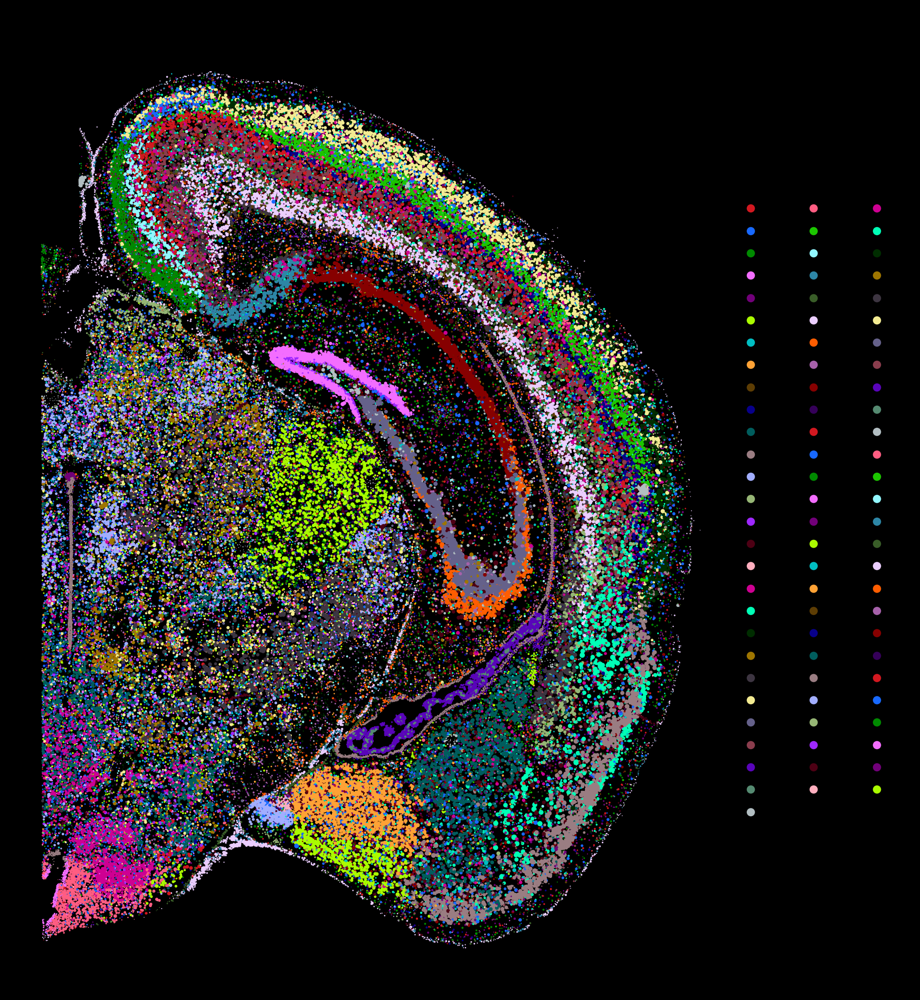

In [32]:
# scanpy._settings.ScanpyConfig(
sc.set_figure_params(figsize=(8,11), facecolor='k', dpi_save=600, vector_friendly=True)

fix, ax = plt.subplots(figsize=(11,15))
# ax.scatter(cell_data['x_um_abs'], cell_data['y_um_abs'], c='gray', s=0.05)
# kwargs = {'facecolor' : 'k'}
ax.set_facecolor('k') 
ax.invert_yaxis()
sc.pl.embedding(adata_merfish, basis="spatial", color="clusters", palette=test_pal,
                ax=ax, save='gene_spatial_map_12b_240819',
                size=adata_merfish.obs['n_counts']/50, frameon=False)

# size=[cell_data['volm'][i]/2000 for i in adata_merfish.obs.index]
# plt.savefig('/home/zgibbs/STARR-FISH/mouse_brain_20CRE_analysis/figures/gene_spatial_map_240707.pdf')

In [33]:
adata_merfish.write_h5ad('/home/zgibbs/STARR-FISH/20CRE_mouse_brain/adata_merfish_zane.h5ad')

In [36]:
adata_merfish.var

,n_cells
2610528A11Rik,1619
A1cf,585
A230050P20Rik,70126
Abca8a,26655
Abcb1b,19489
...,...
Mylk,15740
Mylk4,32563
Myo18b,11194
Myo1e,64144


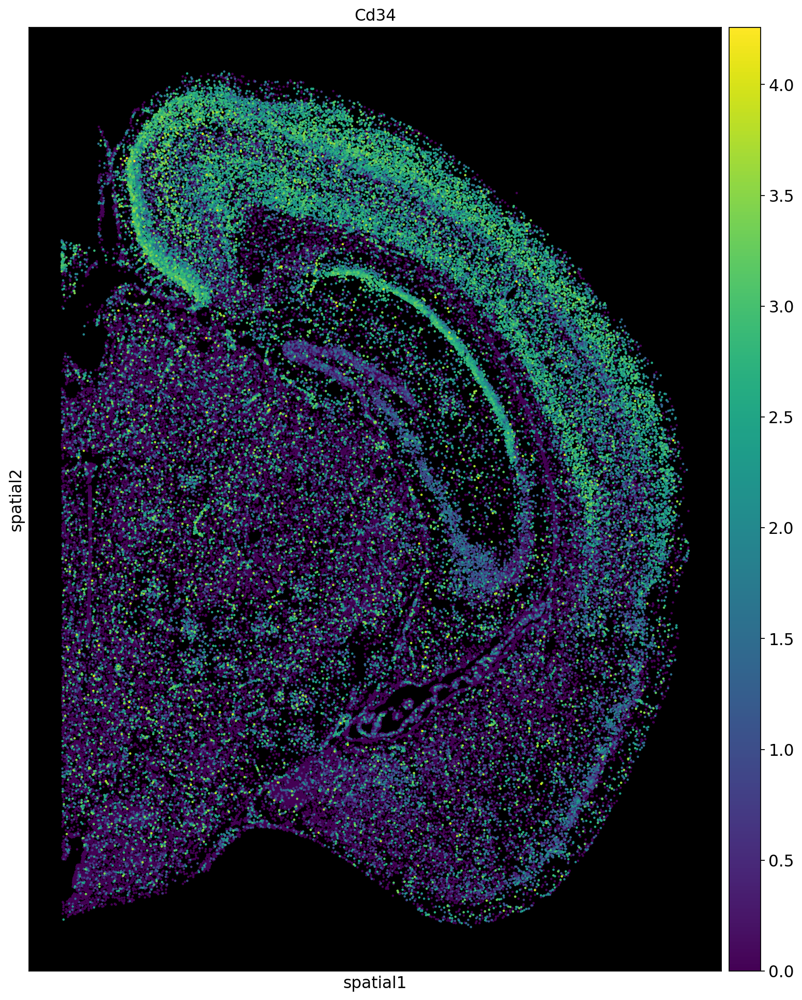

In [312]:
fix, ax = plt.subplots(figsize=(12,15))
ax.set_facecolor('k')
sc.pl.spatial(adata_merfish, img_key=None, color='Cd34', spot_size=20, ax=ax)

In [ ]:
adata_merfish.obs

In [ ]:
adata_merfish.layers

In [ ]:
adata.layers["log_transformed"] = np.log1p(adata.X)

In [209]:
adata_CREs = adata.AnnData(CRE_cbg.iloc[:,:20])

/home/zgibbs/miniconda3/envs/scanpy/lib/python3.9/site-packages/anndata/_core/aligned_df.py:67: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


In [210]:
adata_CREs

AnnData object with n_obs × n_vars = 50638 × 20

In [297]:
test = sc.read_h5ad('Y:\Zane_phpeb3week20CRE_6_1_2024_dataFrames\scdata_Zane_gene_expr_20CRE.h5ad')

FileNotFoundError: [Errno 2] Unable to open file (unable to open file: name = 'Y:\Zane_phpeb3week20CRE_6_1_2024_dataFrames\scdata_Zane_gene_expr_20CRE.h5ad', errno = 2, error message = 'No such file or directory', flags = 0, o_flags = 0)

In [843]:
test

AnnData object with n_obs × n_vars = 90764 × 348
    obs: 'volm', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'leiden'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    uns: 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'umap'
    obsm: 'X_pca', 'X_raw', 'X_spatial', 'X_umap'
    obsp: 'connectivities', 'distances'

In [847]:
coordinates = cell_data.iloc[:,-2:]

In [848]:
coordinates

,x_um_abs,y_um_abs
Conv_zscan__000_112,235.834362,4895.734657
Conv_zscan__000_128,265.343142,4783.313465
Conv_zscan__000_133,275.594801,4927.946395
Conv_zscan__000_145,305.171694,4805.078962
Conv_zscan__000_17,22.389875,4792.894979
...,...,...
Conv_zscan__351_35100733,535.873902,4873.590362
Conv_zscan__351_35100759,392.629281,4928.678394
Conv_zscan__351_35100819,356.514030,4738.340455
Conv_zscan__352_35200818,138.947365,4814.763939


In [ ]:
fix, ax = plt.subplots(figsize=(8,8))
sc.set_figure_params(figsize=(10,10), facecolor='w')
kwargs = {'size' : 5, 'facecolor' : 'w'}
ax.set_facecolor('k')
ax.invert_yaxis()
sc.pl.umap(adata_merfish, color="clusters", ax=ax, **kwargs)